In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
# Appeals court data from the 9th circuit
    
cir=pd.read_pickle('./assets/circuit')

In [3]:
# District court data from all district courts

all_dis=pd.read_pickle('./assets/alldistrict')

In [4]:
# Get edge list 

all_connections_list=pd.read_pickle('./assets/all_connections')

In [5]:
#connections = pd.read_csv('./all.csv')

In [6]:
# Get IDs of appellate court opinions

cir_ids=list(cir['id'])

In [7]:
# Get IDs of trial court opinions from a broader set of jurisdictions

all_dis_ids=list(all_dis['id'])

In [8]:
#appel_and_cir=cir_ids+all_dis_ids

In [9]:
len(cir_ids)

264

In [10]:
len(all_dis_ids)

260

In [11]:
# len(appel_and_cir)

In [12]:
# Build up a table of citation connections between appellate and broader
# set of trial courts

#all_connections_list=connections.loc[(connections['citing_opinion_id'].isin(appel_and_cir))&
#(connections['cited_opinion_id'].isin(cir_ids))]

In [13]:
all_connections_list.shape

(2173, 2)

In [14]:
all_connections_list.head()

,citing_opinion_id,cited_opinion_id
83255,1039606,788122
83264,1039606,179768
83270,1039606,611018
83271,1039606,691024
83291,1039606,726654


In [15]:
G=nx.from_pandas_edgelist(all_connections_list, 
                          source='cited_opinion_id', 
                          target='citing_opinion_id',
                         create_using=nx.MultiDiGraph())

In [16]:
def check_for_circuits(x):
    if x in cir_ids:
        return 'b'
    else:
        return 'r'

In [17]:
for node in G:
    G.nodes[node]['circuit']=check_for_circuits(node)

In [18]:
color_list=[G.nodes[node]['circuit'] for node in G]

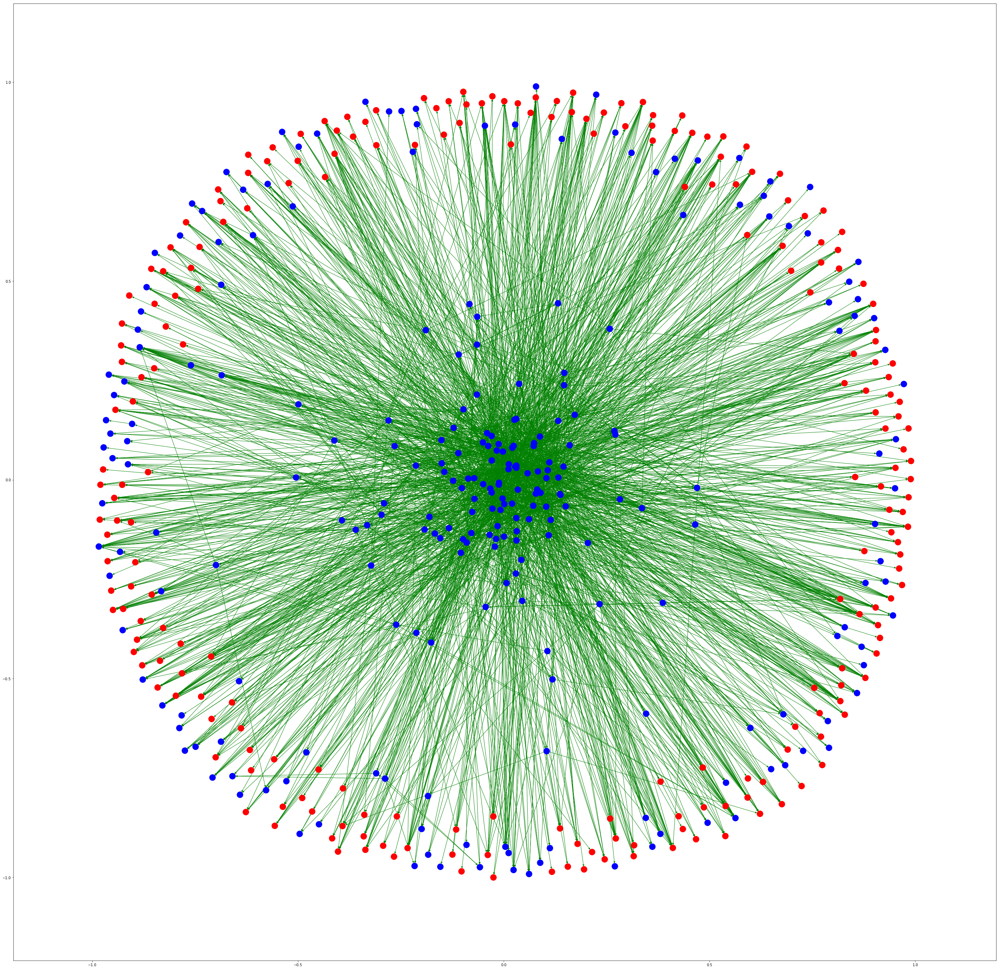

In [19]:
figure, ax = plt.subplots(nrows=1, ncols=1, figsize=(50,50))
nx.draw_networkx(G, 
                 edge_color='g', 
                 node_color=color_list,
                 with_labels=False,
                 ax=ax)
plt.savefig("./assets/network1.png")

In [20]:
centrality=list(nx.out_degree_centrality(G).values())
print(max(centrality))
print(min(centrality))

centrality=pd.Series(centrality)

0.15240083507306887
0.0


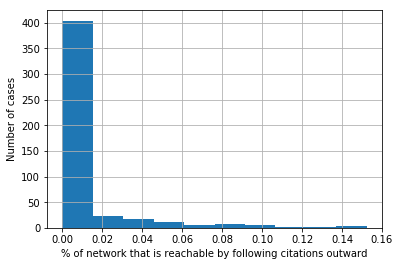

In [21]:
centrality.hist()
plt.xlabel("% of network that is reachable by following citations outward")
plt.ylabel("Number of cases")
plt.savefig("./assets/hist1.png")

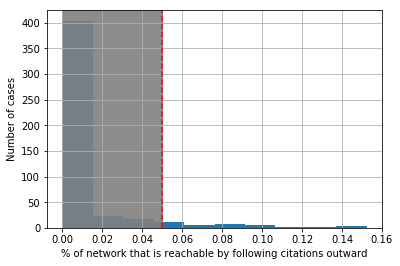

In [22]:
centrality.hist()
plt.xlabel("% of network that is reachable by following citations outward")
plt.ylabel("Number of cases")
plt.axvline(.05, color="red", ls='--')
plt.axvspan(0, 0.05, alpha=0.9, color='grey')
plt.savefig("./assets/hist2.png")

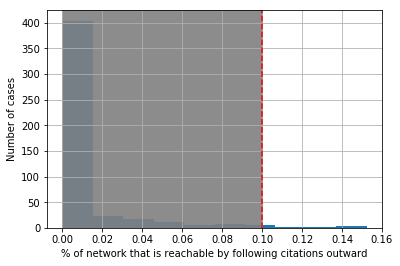

In [23]:
centrality.hist()
plt.xlabel("% of network that is reachable by following citations outward")
plt.ylabel("Number of cases")
plt.axvline(.1, color="red", ls='--')
plt.axvspan(0, 0.1, alpha=0.9, color='grey')
plt.savefig("./assets/hist3.png")

In [24]:
adjusted_centrality=centrality.map(lambda x: 300 + 100000*x)

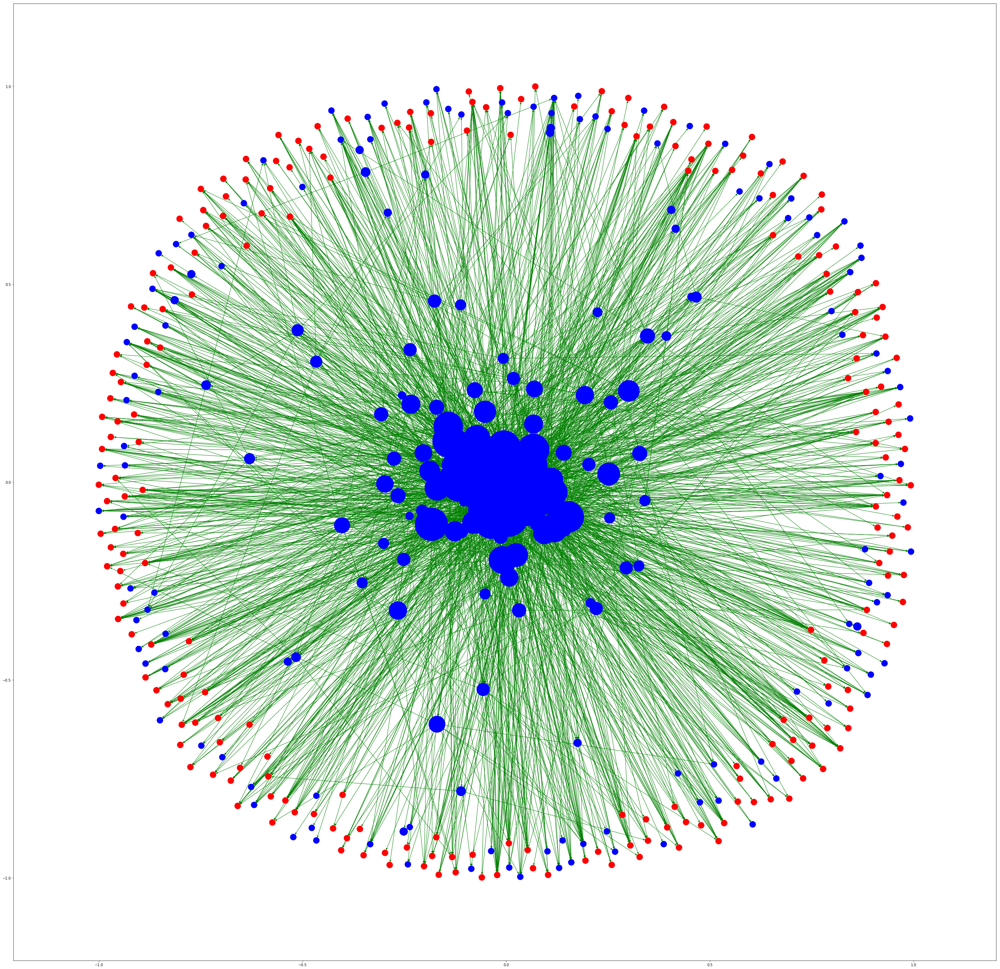

In [25]:
figure, ax = plt.subplots(nrows=1, ncols=1, figsize=(50,50))
nx.draw_networkx(G, 
                 edge_color='g', 
                 node_color=color_list,
                 node_size=adjusted_centrality,
                 with_labels=False,
                 ax=ax)
plt.savefig("./assets/network2.png")

In [26]:
centrality_dict=nx.out_degree_centrality(G)

In [27]:
central_nodes=[node for node in G if centrality_dict[node]>.05 ]

In [28]:
G_sub=G.subgraph(central_nodes)

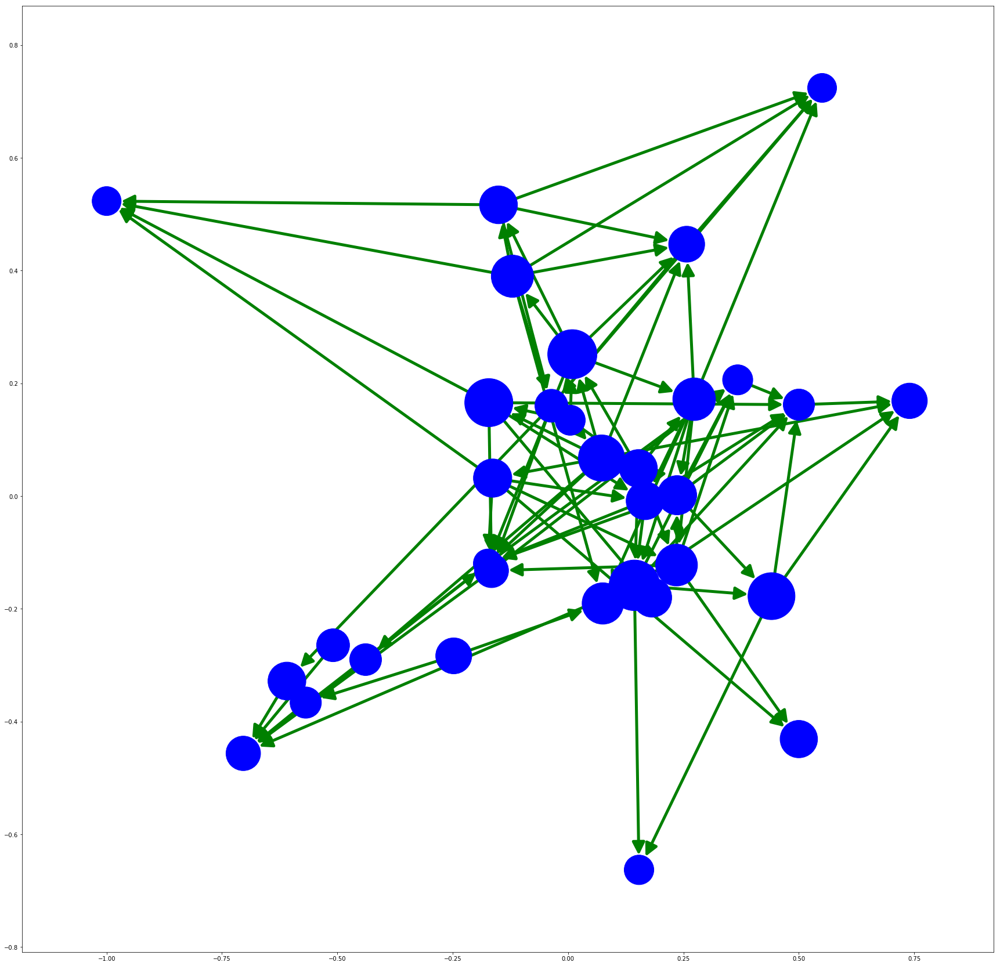

In [29]:
G_sub_centrality=pd.Series([centrality_dict[node] for node in G_sub])

color_list_sub=[G_sub.nodes[node]['circuit'] for node in G_sub]

adjusted_centrality=G_sub_centrality.map(lambda x: 50000*x)

figure, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,30))
nx.draw_networkx(G_sub, 
                 edge_color='g', 
                 node_color=color_list_sub,
                 node_size=adjusted_centrality,
                 with_labels=False,
                 width=5,
                 arrowsize=45,
                 arrows=True,
                 ax=ax)
plt.savefig("./assets/network3.png")

In [30]:
cir=cir.dropna(subset=['citation'])

In [31]:
# Clean up the citation entries, so that they are strings, not strings 
# contained in a list.

cir['citation']=cir['citation'].map(lambda x: x[0])

In [32]:
cite_dict= dict(zip(cir.id, cir.citation))

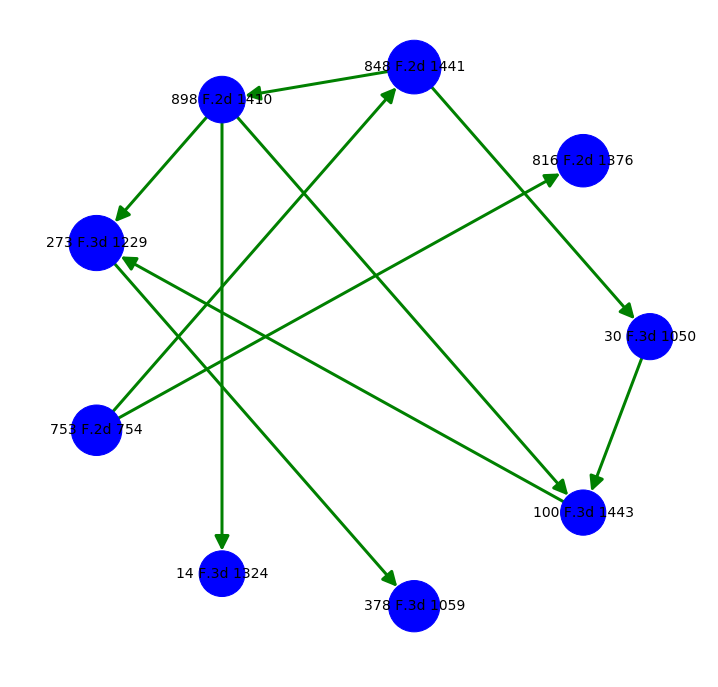

In [33]:
centrality_dict=nx.out_degree_centrality(G)

central_nodes=[node for node in G if centrality_dict[node]>.1 ]

G_sub=G.subgraph(central_nodes)

G_sub_centrality=pd.Series([centrality_dict[node] for node in G_sub])

cite_dict_sub={node:cite_dict[node] for node in G_sub}

color_list_sub=[G_sub.nodes[node]['circuit'] for node in G_sub]

adjusted_centrality=G_sub_centrality.map(lambda x: 20000*x)

figure, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))
nx.draw_shell(G_sub, 
                 edge_color='g', 
                 node_color=color_list_sub,
                 node_size=adjusted_centrality,
                 with_labels=True,
                  labels=cite_dict_sub,
                 width=3,
                 arrowsize=30,
                 arrows=True,
                 font_size=14,
                  font_color='k',
                 ax=ax)
plt.savefig("./assets/network5.png")